# Рынок заведений общественного питания Москвы


Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Заказчики просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

### Загрузка данных и изучение общей информации

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium import Map, Choropleth, Marker

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Приведу название заведений и их адресов для более точной проверки на дубликаты.

In [6]:
print('Количество заведений:', data['name'].nunique())

Количество заведений: 5614


На начальном этапе загрузил необходимы библиотеки, загрузил датасет, вывел общую информацию о данных.

В датасете имеется информация о 5614 заведениях питания в Москве. В столбцах name, category, address, district, hours, price и avg_bill содержится информация о названии, категории, адресе, районе, часах работы, ценовой категории и средней стоимости заказа, представленных в формате объекта. Колонки lat и lng предоставляют данные о географических координатах заведения, а middle_avg_bill и middle_coffee_cup содержат данные о средней стоимости заказа и чашки капучино соответственно. Столбец chain содержит целочисленные значения 1 и 0, указывающие, относится заведение к сети или нет. Однако, столбец seats содержит данные о количестве посадочных мест в виде чисел с плавающей точкой, что является ошибкой. Кроме того, в некоторых столбцах есть пропущенные значения.

Первый этап закончен, можно переходить к предобработке.

### Предобработка данных

In [7]:
data.duplicated().sum()

0

In [8]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Дубликатов в датасете не обнаружено. Что касается пропусков, то можно сказать следующее:
1. Пропущено 536 значений в столбце с данными о времени работы заведения (Время восстанавливать нецелесообразно).
2. Пропущено 3611 значений в данных о количестве посадочных мест - также восстанавливать нет смысла.
3. 7871 пропусков в данных о средней стоимости кружки кофе. Основная характеристика для кофеен и незначительная для всех прочих категорий заведений. Так как это стоимость конкретной отдельной позиции, пытаться восстановить это значение, исходя из суммы среднего чека, будет всё же не совсем корректно, так что придётся оставить эти пропуски как есть.
4. Также имеются пропуски в данных о среднем чеке. Три колонки с данными перекликаются между собой, постараюсь восстановить значения, используя взаимосвязи в таблице.

In [9]:
for col in ['name', 'address', 'avg_bill']:
    data[col] = data[col].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0


Приведем весь текст в нижний регистр.

In [10]:
data[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


После проверки обнаружили неявные дубликаты - избавимся от них.

In [11]:
data.drop_duplicates(subset=['name', 'address'], keep='first').reset_index(drop=True)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8397,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8398,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8399,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,средний счёт:от 150 ₽,150.0,NaN,0,150.0
8400,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


По моему мнению, заполнять пропуски в стобцах, где присутствуют значения о среднем чеке нерационально. Так как во всем датасете представлены данные о ресторанах и заведениях с довольно существенной разницой в ценовых категориях - заполнять пропуск в данных о среднем чеке средним чеком между кофейней и рестораном, с категорией цен "высокие" нецелесообразно.

Далее создам дополнительные столбцы.

In [12]:
data['street'] = data['address'].apply(lambda x: x.split(',')[1].strip())

In [13]:
data['is_24_7'] = data['hours'].apply(lambda x: True if isinstance(x, str) and 'ежедневно, круглосуточно' in x else False)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Столбцы добавлены корректно.
</div>

<div class="alert alert-danger" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
✍ 
К сожалению отсутствует промежуточный вывод о проделанной работе в разделе. Дополни, пожалуйста.
</div>

На этапе предобработки данных было выявлено, что явные дубликаты отсутствуют, а неявные удалены. Также были обнаружены пропуски в столбцах о среднем чеке - восполнять пропуски нерационально, так как во всем датасете представлены данные о ресторанах и заведениях с довольно существенной разницой в ценовых категориях. 
Были созданы доболнительные столбцы с обозначением улицы заведения, а также индикатор, отображающий, работает ли заведение 24/7 или нет.

### Анализ данных

#### Категории заведений

In [14]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Text(0, 0.5, 'Частота')

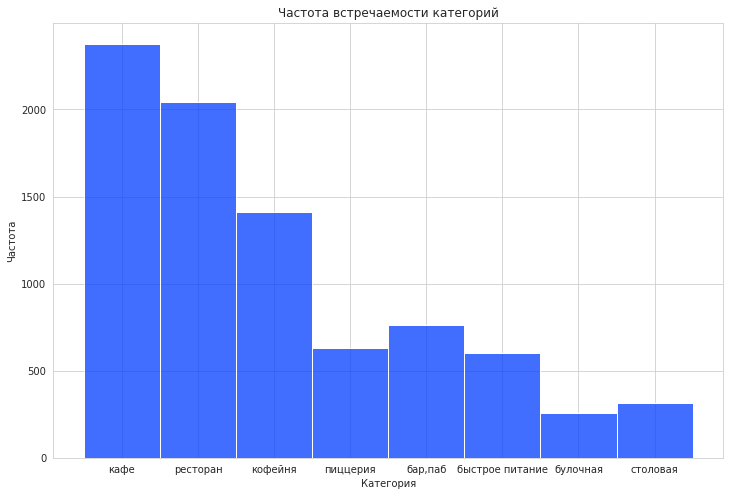

In [15]:
sns.set_style("whitegrid")
sns.set_palette("bright")
plt.figure(figsize=(12, 8))
sns.histplot(data['category'], discrete=True)
plt.title('Частота встречаемости категорий')
plt.xlabel('Категория')
plt.ylabel('Частота')

Больше всего заведений в формате кафе, ресторана и кофейни. Пиццерия находится на 4 месте, а бары на 5. Это говорит о том, что заведения сейчас создаются в формате "все включено" - перемешиваются разные кухни, форматы, чтобы собрать как можно больше целевой аудитории.

####  Количество посадочных мест 

In [16]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Сразу построю "ящики с усами" для наглядности.

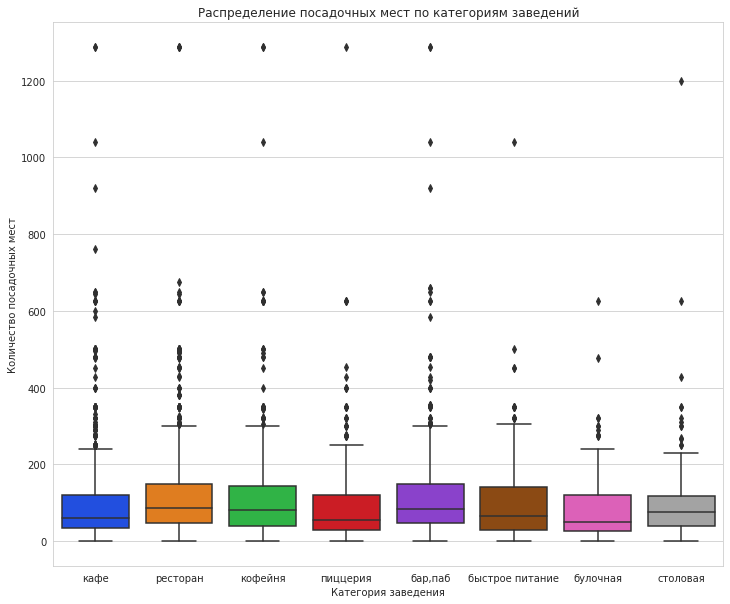

In [17]:
plt.figure(figsize=(12, 10))
sns.boxplot(data=data, x='category', y='seats')
plt.title('Распределение посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

Затем необходимо отсечь выбросы.

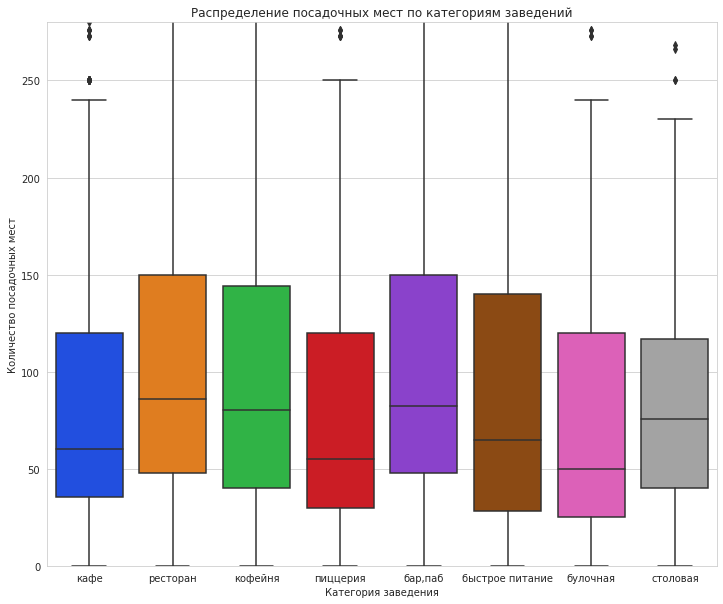

In [18]:
plt.figure(figsize=(12, 10))
sns.boxplot(data=data, x='category', y='seats')
plt.ylim(0, 280)
plt.title('Распределение посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

Исходя из данной визуализации, можно сделать вывод, что диапазон количества мест в заведениях составляет примерно от 40 до 150, при этом медианное значение - 75 мест в одном заведении. 

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Супер, визуализация наглядная и понятная. Вывод корректный.
</div>

####  Соотношение сетевых и несетевых заведений

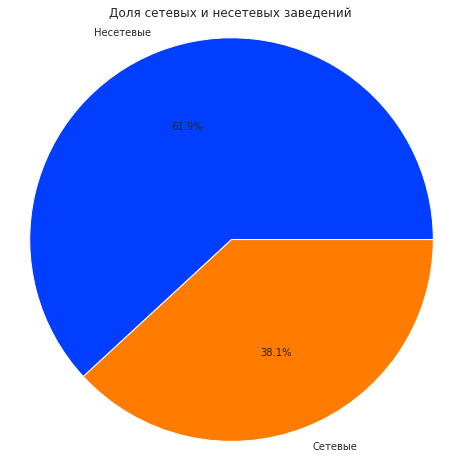

In [19]:
chain_cnt = data['chain'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(chain_cnt, labels=['Несетевые', 'Сетевые'], autopct='%1.1f%%')
plt.title('Доля сетевых и несетевых заведений')
plt.axis('equal')
plt.show()

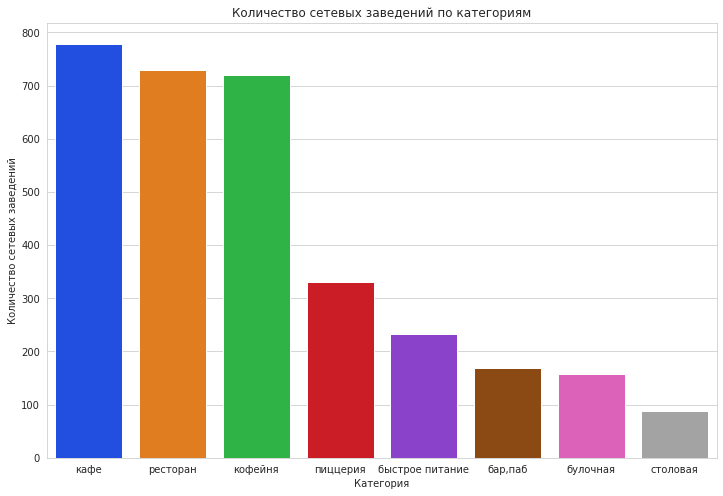

In [20]:
category_cnt = data.groupby('category')['chain'].value_counts().unstack()
category_cnt['total'] = category_cnt.sum(axis=1)
category_cnt = category_cnt.sort_values(by=1, ascending=False)
plt.figure(figsize=(12, 8))
sns.barplot(x=category_cnt.index, y=category_cnt[1])
plt.title('Количество сетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество сетевых заведений')
plt.show()

Доля сетевых и несетевым соотносится как 38,1% к 61,9%. Среди сетевых заведений наиболее распространены кафе, рестораны и кофейни.

/opt/conda/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


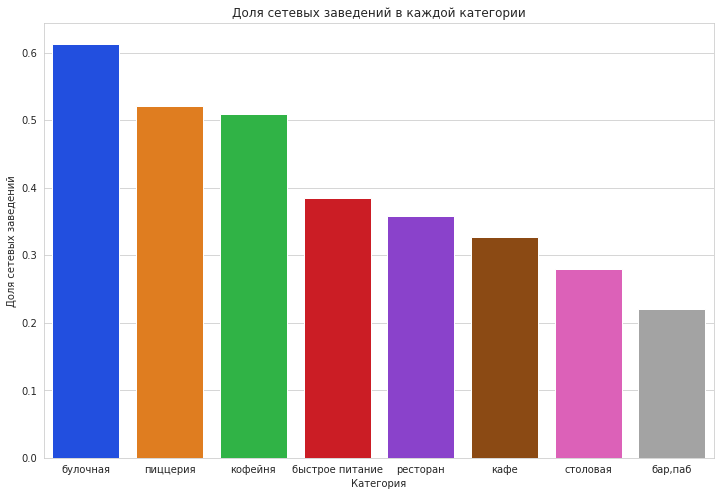

In [21]:
total_count = data.groupby('category')['name'].count()
chain_count = (data[data['chain'] == True]
               .groupby('category')['name'].count()
               .sort_values(ascending=False)
)

chain_ratio = chain_count / total_count
chain_ratio = chain_ratio.sort_values(ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(chain_ratio.index, chain_ratio.values)
plt.xlabel('Категория')
plt.ylabel('Доля сетевых заведений')
plt.title('Доля сетевых заведений в каждой категории')
plt.show()

Видим, что в разрезе по категориям сетевых заведений большие доли занимают булочные, пиццерии и кофейни

#### Топ-15 популярных сетей в Москве

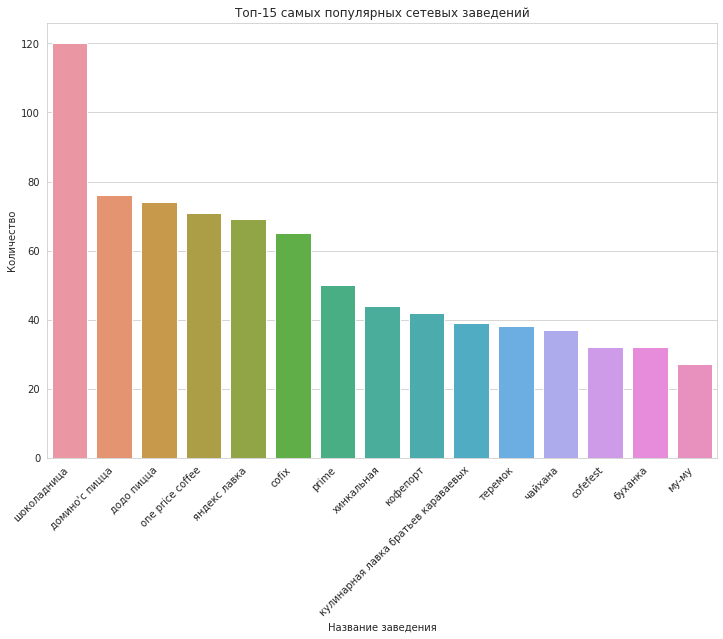

In [22]:
top = data.query('chain == 1')['name'].value_counts().head(15)
plt.figure(figsize=(12, 8))
sns.barplot(x=top.index, y=top.values)
plt.title('Топ-15 самых популярных сетевых заведений')
plt.xlabel('Название заведения')
plt.ylabel('Количество')
plt.xticks(rotation=45, ha='right')
plt.show()

In [23]:
top

шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
cofefest                                32
буханка                                 32
му-му                                   27
Name: name, dtype: int64

In [24]:
top = data.query('chain == 1')
top_pivot = (top
    .pivot_table(index='category', values='name', aggfunc='count')
    .sort_values(by='name', ascending=False)
)
top_pivot

,name
category,
кафе,779
ресторан,730
кофейня,720
пиццерия,330
быстрое питание,232
"бар,паб",169
булочная,157
столовая,88


Абсолютным лидером по количеству заведений в Москве является сеть "Шоколадница", на втором месте "Домино'с пицца", бронза у "Додо Пицца". Аутсайдером по количеству заведений является сеть ресторанов "Му-му". Если рассматривать топ по категориям, то лидируют кафе, рестораны, кофейни.

#### Административные районы Москвы

In [25]:
state_geo = '/datasets/admin_level_geomap.geojson'
 
moscow_lat, moscow_lng = 55.751244, 37.618423
 
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
 
# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
 
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=data.groupby('district', as_index=False)['rating'].agg('mean'),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
 
# выводим карту
m

In [26]:
display(data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating', ascending=False))

,district,rating
5,Центральный административный округ,4.377520
2,Северный административный округ,4.239778
4,Северо-Западный административный округ,4.208802
8,Южный административный округ,4.184417
1,Западный административный округ,4.181551
0,Восточный административный округ,4.174185
7,Юго-Западный административный округ,4.172920
3,Северо-Восточный административный округ,4.148260
6,Юго-Восточный административный округ,4.101120


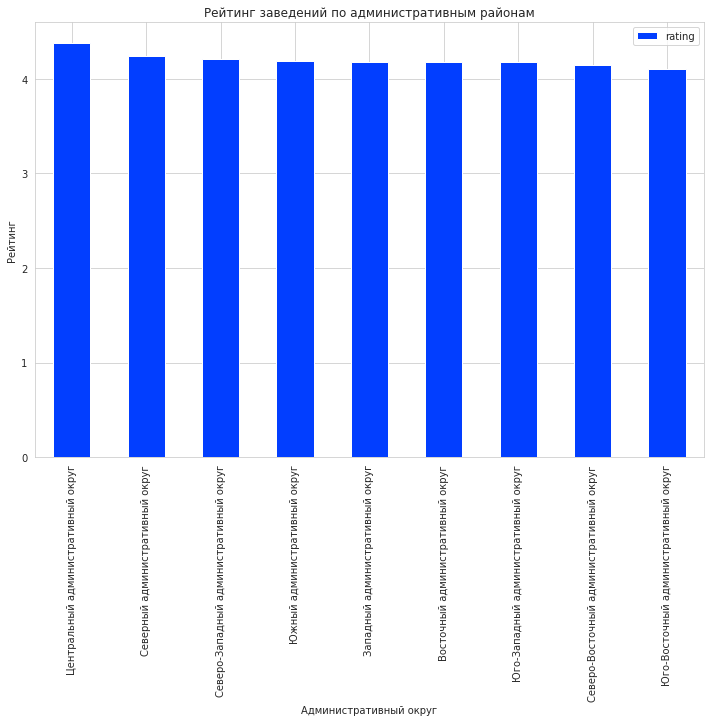

In [27]:
dist = (data
        .pivot_table(index='district', values='rating', aggfunc='mean')
        .sort_values(by='rating', ascending=False)
       )
dist.plot(figsize=(12, 8), kind='bar')
plt.title('Рейтинг заведений по административным районам')
plt.xlabel('Административный округ')
plt.ylabel('Рейтинг')
plt.show()

Сразу видно, что в районе ЦАО самая наивысшая средняя оценка, среди остальных районов. На втором месте по рейтингу заведений находится САО, на третьем - СЗАО. Закономерность прослеживается - чем ближе к центру, тем выше сервис, а соответсвенно, и отзывы.

#### Распределение средних рейтингов по категориям заведений

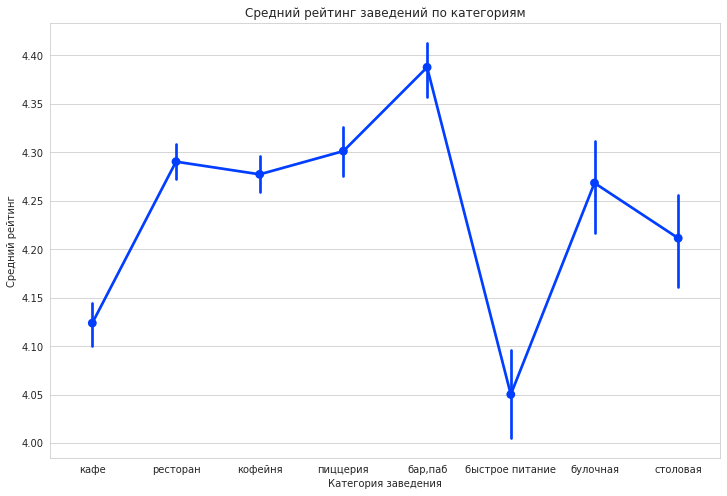

In [28]:
plt.figure(figsize=(12, 8))
sns.pointplot(data=data, x='category', y='rating')
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.show()

Если смотреть в разрезе по категориям, то наихудший рейтинг имеют заведения в категории "быстрое питание", а также "кафе". При этом, как бы странно не казалось, но лидерами являются бары и пабы, обгоняя рестораны и кофейни. Делаю на это акцент, так как ранее мы выяснили, что бары и пабы не входят даже в пятерку заведений по популярности.

In [29]:
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

In [30]:
clusters = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(clusters)
data.apply(create_clusters, axis=1)
clusters

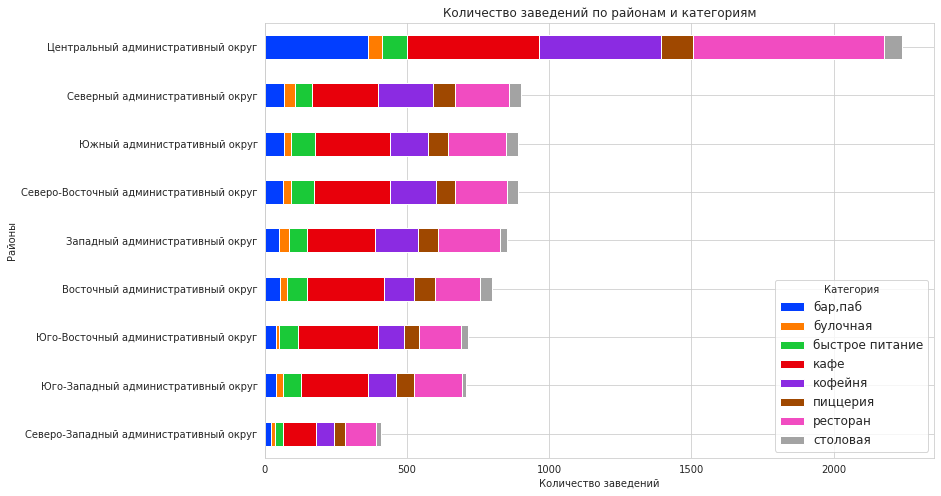

In [31]:
district_cnt = data.groupby(['district', 'category']).size().unstack()
district_cnt = district_cnt.reindex(sorted(district_cnt.columns), axis=1)
district_cnt['total'] = district_cnt.sum(axis=1)  
district_cnt = district_cnt.sort_values(by='total', ascending=True).drop('total', axis=1)
fig, ax = plt.subplots(figsize=(12, 8))
district_cnt.plot(kind='barh', stacked=True, edgecolor='white', ax=ax)
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Районы')
ax.set_title('Количество заведений по районам и категориям')
ax.legend(title='Категория', fontsize='large')
plt.show()

Визуализация в разрезе по районам показывает, что везде преобладает три основные категории, которые мы выявили ранее: кафе, кофейня, ресторан. Меньше всего заведений в СЗАО.

#### Топ-15 улиц по количеству заведений

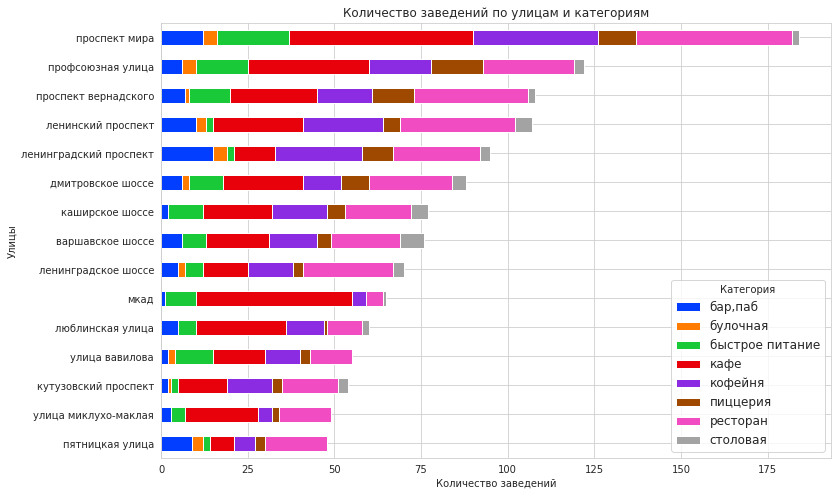

In [32]:
top_streets = data['street'].value_counts().head(15)
data_streets = data.query('street in @top_streets.index')

streets_cnt = data_streets.groupby(['street', 'category']).size().unstack()
streets_cnt = streets_cnt.reindex(sorted(streets_cnt.columns), axis=1)
streets_cnt['total'] = streets_cnt.sum(axis=1)
streets_cnt = streets_cnt.sort_values(by='total', ascending=True).drop('total', axis=1)
fig, ax = plt.subplots(figsize=(12, 8))
streets_cnt.plot(kind='barh', stacked=True, edgecolor='white', ax=ax)
ax.set_xlabel('Количество заведений')
ax.set_ylabel('Улицы')
ax.set_title('Количество заведений по улицам и категориям')
ax.legend(title='Категория', fontsize='large')
plt.show()

Наибольшее количество заведений находится на Проспекте Мира (Центральный административный округ).

#### Улицы, на которых находится только один объект общепита

In [33]:
data['street'].value_counts().sort_values()

улица шухова                   1
малая андроньевская улица      1
улица ватутина                 1
3-я радиаторская улица         1
дурасовский переулок           1
                            ... 
ленинградский проспект        95
ленинский проспект           107
проспект вернадского         108
профсоюзная улица            122
проспект мира                184
Name: street, Length: 1447, dtype: int64

In [34]:
data['street'].value_counts().sort_values().head(458)

улица шухова                     1
малая андроньевская улица        1
улица ватутина                   1
3-я радиаторская улица           1
дурасовский переулок             1
                                ..
симферопольский проезд           1
парк технических видов спорта    1
леонтьевский переулок            1
аллея молодожёнов                1
2-я песчаная улица               2
Name: street, Length: 458, dtype: int64

Всего улиц, на котором располагается одно заведение - 457.

In [35]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

#### Значения среднего чека

In [36]:
data['middle_avg_bill'] = pd.to_numeric(data['middle_avg_bill'])

In [37]:
mb = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
folium.Choropleth(
    geo_data=state_geo,
    data=data.groupby('district', as_index=False)['middle_avg_bill'].agg('median'),
    columns=['district', 'middle_avg_bill'],
    key_on='feature.properties.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианный чек по районам',
).add_to(mb)
mb

Отчетливо видно, что самые высокие цены в ЦАО, на втором месте ЗАО. Чем дальше от центра, тем ниже средний чек в заведении. 

In [38]:
avg_bill = (data
            .pivot_table(index='district', values='middle_avg_bill', aggfunc='median')
            .sort_values(by='middle_avg_bill', ascending=False)
)
avg_bill

,middle_avg_bill
district,
Западный административный округ,1000.0
Центральный административный округ,1000.0
Северо-Западный административный округ,700.0
Северный административный округ,650.0
Юго-Западный административный округ,600.0
Восточный административный округ,575.0
Северо-Восточный административный округ,500.0
Южный административный округ,500.0
Юго-Восточный административный округ,450.0


# Промежуточный вывод


Исходя из проведенного анализа, можно подвести следующие итоги: 

1. Больше всего заведений в формате кафе, ресторана и кофейни
2. Диапазон количества посадочных мест в заведениях составляет примерно от 40 до 150, при этом медианное значение - 75 мест в одном заведении
3. Доля сетевых и несетевым соотносится как 38,1% к 61,9%. Среди сетевых заведений также наиболее распространены кафе, рестораны и кофейни
4. Абсолютным лидером по количеству заведений в Москве является сеть "Шоколадница", на втором месте "Домино'с пицца", бронза у "Додо Пицца". Аутсайдером по количеству заведений является сеть ресторанов "Му-му"
5. В районе ЦАО самая наивысшая средняя оценка заведений, среди остальных районов. Наихудший рейтинг имеют заведения в категории "быстрое питание", а также "кафе". 
6. Наибольшее количество заведений также находится в ЦАО, также здесь наблюдается самый высокий средний чек по сравнению с другими админимтративными округами.


### Кофейни

In [39]:
coffee = data.query('category == "кофейня"')

Сделаем срез данных для дальнейшей работы только с кофейнями.

In [40]:
print('Количество кофеен в датасете:', coffee['name'].count())

Количество кофеен в датасете: 1413


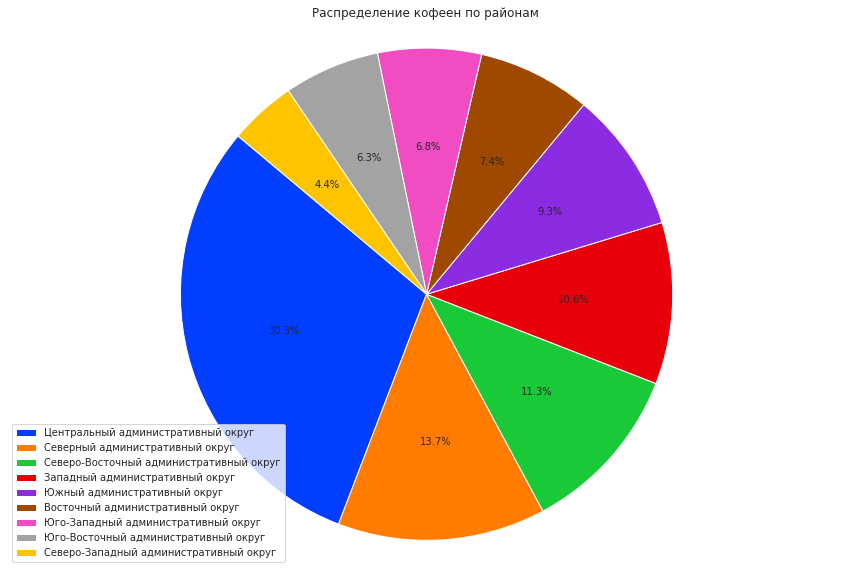

In [41]:
coffee_district = coffee['district'].value_counts()

plt.figure(figsize=(15, 10))
patches, texts, autotexts = plt.pie(coffee_district, autopct='%1.1f%%', startangle=140)
plt.title('Распределение кофеен по районам')
plt.axis('equal')
plt.legend(patches, coffee_district.index, loc='best')
plt.show()

Отчетливо видно, что большинство кофеен располагается также в ЦАО. На втором месте по количеству кофеен - САО.

In [42]:
print(coffee['hours'].value_counts())

ежедневно, 10:00–22:00                  140
ежедневно, 08:00–22:00                   60
ежедневно, круглосуточно                 59
ежедневно, 09:00–22:00                   57
пн-пт 08:00–21:00; сб,вс 09:00–21:00     46
                                       ... 
пн-пт 07:30–19:30; сб,вс 10:30–19:30      1
пн-пт 08:20–21:30; сб,вс 10:00–21:30      1
пн-пт 07:00–23:00; сб,вс 08:30–23:00      1
пн-пт 08:00–19:00; сб 09:00–15:00         1
пн-пт 08:00–22:00                         1
Name: hours, Length: 362, dtype: int64


Что касается часов работы, то преобладает график с 10:00 до 22:00. Однако, не малую долю занимают кофейни с графиком 8:00-22:00 - здесь можно ожидать больший приток клиентов, так как люди чаще всего заходят за кофе перед работой. Круглосуточных кофеен - 59.

In [43]:
print('Cредний чек по кофейням:', coffee["middle_avg_bill"].median(), 'руб.')
print('Cредняя стоимость кружки кофе:', coffee["middle_coffee_cup"].median(), 'руб.')

Cредний чек по кофейням: 400.0 руб.
Cредняя стоимость кружки кофе: 170.0 руб.


### Итоговый вывод

Была проведена работа по исследованию рынка заведений общественного питания Москвы. На начальном этапе были загружены данные, выполнена предобработка. Сразу хотелось бы отметить качество данных - в ходе предобработки было выявлено большое количество пропущенных значений, восстановление которых исказило бы картину еще сильнее. Также, в базовый датасет было добавлено два столбца - улица, на котором располагается заведение, а также обозначение режима работы (круглосуточно или нет).

Также были выявлены следующие факты:

1. Больше всего заведений в формате кафе, ресторана и кофейни
2. Диапазон количества посадочных мест в заведениях составляет примерно от 40 до 150, при этом медианное значение - 75 мест в одном заведении
3. Доля сетевых и несетевым соотносится как 38,1% к 61,9%. Среди сетевых заведений также наиболее распространены кафе, рестораны и кофейни
4. Абсолютным лидером по количеству заведений в Москве является сеть "Шоколадница", на втором месте "Домино'с пицца", бронза у "Додо Пицца". Аутсайдером по количеству заведений является сеть ресторанов "Му-му"
5. В районе ЦАО самая наивысшая средняя оценка заведений, среди остальных районов. Наихудший рейтинг имеют заведения в категории "быстрое питание", а также "кафе". 
6. Наибольшее количество заведений также находится в ЦАО, также здесь наблюдается самый высокий средний чек по сравнению с другими административными округами.

### Рекомендации для заказчика

Подытоживая вышесказанное, можно выделить следующие рекомендации:

Расположение.
ЦАО: в этом районе максимальны все показатели. Высокая конкуренция, высокая стоимость аренды, но и высокие средние чеки и высокий спрос.
ЮЗАО: конкуренция ниже среднего, при этом высокие показатели среднего чека и стоимости кружки, кофейни в этом районе получают умеренно хорошие оценки.
ЗАО: умеренная конкуренция, высокий средний чек и стоимость кружки, однако придётся постараться понравиться потребителю.
САО: конкуренция чуть выше среднего, чеки на среднем уровне, средне-хорошие оценки. Среднячковый вариант.
СЗАО: невысокая конкуренция и отличные оценки от потребителей, чек на среднем уровне.
ВАО и ЮВАО: невысокая конкуренция и невысокий средний чек, оценки чуть выше среднего.
Стоит учитывать, что в районах с невысокой конкуренцией СЗАО, ВАО и ЮВАО и уровень спроса может быть ниже.

Часы работы.
кофе утренний напиток и предпочитетельнее открывать кофейню с прицелом на ранний завтрак, как и работает большинство из представленных заведений.
в случае размещения в ЦАО возможен режим работы 24 на 7 в случае высокой круглосуточной проходимости близлежащей к заведению зоны.
в случае режима работы с 8.00 возможно размещение в формате "на вынос" рядом с местами посадки людей на общественный транспорт.
в случае размещения рядом с офисными центрами можно выбирать режим работы с 9.00 или 10.00, рассчитывая на посещение теми, кто уже добрался до рабочего места.

### Презентация

https://docs.google.com/presentation/d/1PBP-UuaR5EeQubdTEolDuE3-chiEp0IC40X-DmQ8nVE/edit?usp=sharing